In [1]:
from functions import *
from functions_new import *

import numpy as np
import pandas as pd
import os 

import matplotlib.pylab as plt
import matplotlib.patches as patches
from matplotlib.patches import Circle

import seaborn as sns
from seaborn import heatmap
from seaborn import kdeplot

from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture
from sklearn.cluster import KMeans

from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import pdist
from scipy.signal import savgol_filter

import SOAPify
from SOAPify import SOAPclassification, calculateTransitionMatrix, normalizeMatrixByRow, getSOAPSettings
import SOAPify.HDF5er as HDF5er

from MDAnalysis import Universe as mdaUniverse
from MDAnalysis import transformations
from MDAnalysis.tests.datafiles import TPR, XTC
import MDAnalysis.analysis.msd as msd
from SOAPify.HDF5er import MDA2HDF5
from os import path
import hdbscan
from MDAnalysis.analysis import rdf

from scipy.cluster import hierarchy
from scipy.cluster.hierarchy import fcluster

/home/cristina/programs/SOAPify/latest_venv/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
XYZ_DIR = 'INPUT_files/211_600/'
XYZ_OUTDIR = '211_600/'
NAME = '211_600_every12ps' # NAME.hdf5
GROUP = "/Trajectories/"+NAME
MASK = True #be sure that mask used to create .hdf5 is the same used here

LOAD_HDF5 = True
LOAD_HDF5SOAP = True
LOAD_SOAP = True
LOAD_TimeSOAP = True
LOAD_LENS = True
dt = 1

TRJ_filename = NAME + ".xyz"  # or .lammpsdump 
TOP_filename = topo = NAME + ".data"  # or .data

XYZ_ORIG = [0, 0, 0]
COFF=6  #be sure that is the same coff used to create soaps and lenses
window_length=10
polyorder = 2
wantedTrajectory = slice(0, None, None)
wantedUniverseAtoms = "type Cu"
INIT=0
END=500
STRIDE=1

eq=0

SOAPnmax = 8
SOAPlmax = 8
SOAPatomMask = "Cu"

## Create HDF5 File from TOP and TRJ files

In [3]:
if LOAD_HDF5:
    
    if MASK:
        HDF5_TRJ  = NAME + "mask.hdf5"
        HDF5_TRJ_nomask  = NAME + ".hdf5"
        with h5py.File(XYZ_DIR + HDF5_TRJ, "r") as trajFile:
            tgroup = trajFile[GROUP]
            universe = HDF5er.createUniverseFromSlice(tgroup, wantedTrajectory)
    else:
        HDF5_TRJ  = NAME + ".hdf5"
        HDF5_TRJ_nomask  = NAME + ".hdf5"
        with h5py.File(XYZ_DIR + HDF5_TRJ, "r") as trajFile:
            tgroup = trajFile[GROUP]
            universe = HDF5er.createUniverseFromSlice(tgroup, wantedTrajectory)
    
else:
    mycwd = os.getcwd()
    os.chdir(XYZ_DIR)
    createHDF5(TRJ_filename, TOP_filename, wantedUniverseAtoms)  # Create HDF5 File (if not present)
    os.chdir(mycwd)
    
    if MASK:  # TODO: change HDF5 filename in mask.hdf5
        HDF5_TRJ  = NAME + "mask.hdf5"
        HDF5_TRJ_nomask  = NAME + ".hdf5"
        with h5py.File(XYZ_DIR + HDF5_TRJ, "r") as trajFile:
            tgroup = trajFile[GROUP]
            universe = HDF5er.createUniverseFromSlice(tgroup, wantedTrajectory)
            
    else:
        HDF5_TRJ  = NAME + ".hdf5"
        HDF5_TRJ_nomask  = NAME + ".hdf5"
        with h5py.File(XYZ_DIR + HDF5_TRJ, "r") as trajFile:
            tgroup = trajFile[GROUP]
            universe = HDF5er.createUniverseFromSlice(tgroup, wantedTrajectory)

In [4]:
nAtoms = len(universe.atoms)
windowToUSE = slice(eq+window_length // 2, -(window_length // 2))  # checked for both EVEN and ODD windows
windowToUSE_last = slice(eq+window_length // 2, -(window_length // 2+1))

In [5]:
print(windowToUSE)
print(windowToUSE_last)

slice(5, -5, None)
slice(5, -6, None)


## Create HDF5SOAP File

In [6]:
if LOAD_SOAP:
    pass

else:
    
    mycwd = os.getcwd()
    os.chdir(XYZ_DIR)
    prepareSOAP(HDF5_TRJ_nomask, NAME, COFF, SOAPnmax, SOAPlmax, SOAPatomMask)
    os.chdir(mycwd)

# 1. TimeSOAP

## Read TimeSOAP input

In [7]:
if LOAD_TimeSOAP:
    tsoap = np.load(XYZ_DIR+'time_dSOAP.npz')['name1']
    print(np.shape(tsoap))
else:

    if MASK:
        with h5py.File(XYZ_DIR+NAME+'.hdf5', 'r') as f:
            mask = f[GROUP+"Trajectory"][0, :, 2] > 12
        
        with h5py.File(XYZ_DIR+NAME+'soap.hdf5', 'r') as f:
            ds = f["SOAP/"+NAME]
            fillSettings = getSOAPSettings(ds)
            X = ds[:][:, mask]
        
    else: 
        with h5py.File(XYZ_DIR+NAME+'soap.hdf5', 'r') as f:
            ds = f["SOAP/"+NAME]
            fillSettings = getSOAPSettings(ds)
            X = ds[:, :, :]

    X = SOAPify.fillSOAPVectorFromdscribe(
            X[:], **fillSettings)
        

    X = SOAPify.normalizeArray(X)
    np.savez(XYZ_DIR+'X_normalized.npz', name1=X)
    
    v_soap = np.load(XYZ_DIR+'X_normalized.npz')['name1'][windowToUSE]
    print(np.shape(v_soap))
    
    nAtoms, tSOAP, dtSOAP = getTimeSOAP(XYZ_DIR+NAME+'soap.hdf5', NAME)   

(2000, 995)


In [8]:
nAtoms = np.shape(tsoap)[1]

In [9]:
tsoap_fl = np.array(tsoap).reshape(np.shape(tsoap)[0]*np.shape(tsoap)[1])
np.shape(tsoap_fl)

(1990000,)

## Filtering

In [10]:
tSOAP_rolling = moving_average(np.array(tsoap).T, window_length)
min = np.min(tSOAP_rolling)
print(min)
max = np.max(tSOAP_rolling)
print(max)
tSOAP_rolling_norm = (tSOAP_rolling-min)/(max-min)  # NORMALIZATION
tr_tSOAP_rolling = np.array(tSOAP_rolling_norm).T
fl_tSOAP_rolling = np.reshape(tr_tSOAP_rolling, np.shape(tr_tSOAP_rolling)[0]*np.shape(tr_tSOAP_rolling)[1])

0.005100819307364214
0.08480519999524845


In [11]:
dataToFit = transposeAndFlatten(tSOAP_rolling_norm)
print("minmax: ", np.min(dataToFit), np.max(dataToFit))

minmax:  0.0 1.0


In [12]:
savGolPrint = np.arange(tSOAP_rolling_norm.shape[1])

In [13]:
time = np.arange(savGolPrint[0]+window_length // 2 + 1, savGolPrint[-1]+window_length // 2 + 2 )
xticks = np.array(list(filter(lambda x: (x % 500 == 0), time)))

In [14]:
xticks = [0, 500, 1000, 1500, 2000]

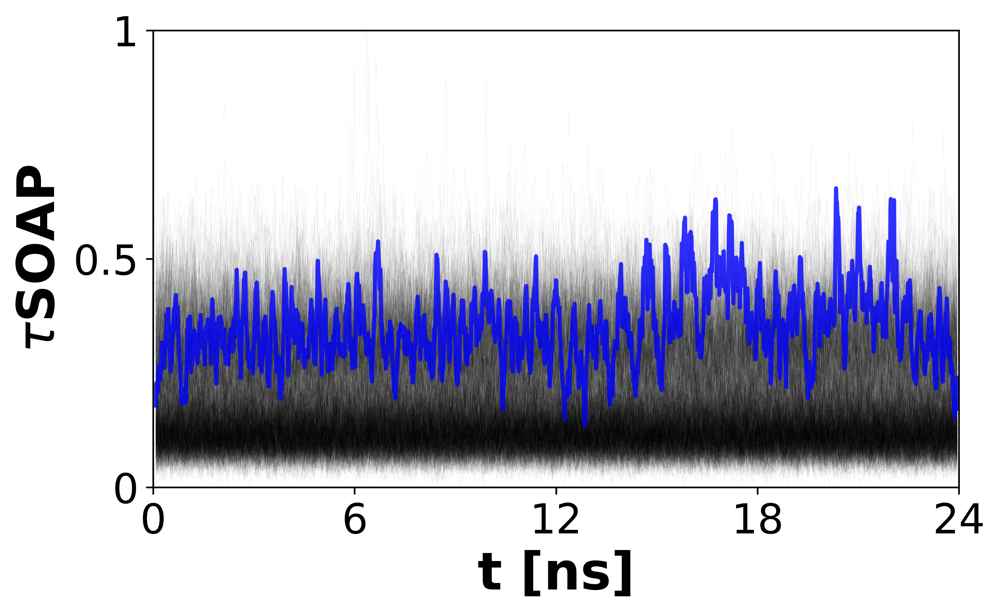

In [17]:
fig, axes = plt.subplots(
    1, figsize=(7, 4), dpi=500
)

for flns in tSOAP_rolling_norm:
    axes.plot(
        time,
        flns,
        color="black",
        linewidth=0.01,
        alpha=0.8,
    )
    
axes.plot(
        time,
        tSOAP_rolling_norm[460],
        color="blue",
        linewidth=2,
        alpha=0.8)

axes.set_xlim(savGolPrint[0]+window_length // 2, savGolPrint[-1]+window_length // 2)
axes.set_xlabel(r't [ns]', weight='bold', size=25)
axes.set_xticks(xticks)
axes.set_xticklabels([0, 6, 12, 18, 24], fontsize=20)

axes.set_ylabel(r'$\tau$SOAP', weight='bold', size=25)
axes.set_yticks([0, 0.5, 1])
axes.set_yticklabels([0,0.5,1], fontsize=20)
axes.set_ylim((0,1))


plt.subplots_adjust(wspace=0.08)
plt.savefig(XYZ_OUTDIR+'Figure/tSOAP_withTRJ.png', bbox_inches='tight')

# 2. LENS

# Read LENS input 

In [18]:
if LOAD_LENS:
    LENS = np.load(XYZ_DIR+'lens.npy')
else:
    neigCounts = SOAPify.analysis.listNeighboursAlongTrajectory(universe, cutOff=COFF)
    LENS, nn, *_ = SOAPify.analysis.neighbourChangeInTime(neigCounts)
    np.save(XYZ_DIR+"lens", LENS)

In [19]:
LENS.shape

(995, 2001)

In [20]:
# Remove the first frame (=0.0)
LENS = LENS[:, dt:]

In [21]:
len(LENS[0])

2000

In [22]:
atom = nAtoms - 1

# Filtering

In [23]:
LENS_rolling = moving_average(LENS, window_length)
min = np.min(LENS_rolling)
print(min)
max = np.max(LENS_rolling)
print(max)
LENS_rolling_norm = (LENS_rolling-min)/(max-min)  # NORMALIZATION
tr_LENS_rolling = np.array(LENS_rolling_norm).T
fl_LENS_rolling = np.reshape(tr_LENS_rolling, np.shape(tr_LENS_rolling)[0]*np.shape(tr_LENS_rolling)[1])

0.0
0.3581555636316158


In [24]:
savGolPrint = np.arange(LENS_rolling_norm.shape[1])

In [25]:
LENS_rolling.shape

(995, 1991)

In [26]:
dataToFit = transposeAndFlatten(LENS_rolling_norm)
print("minmax: ", np.min(dataToFit), np.max(dataToFit))

minmax:  0.0 1.0


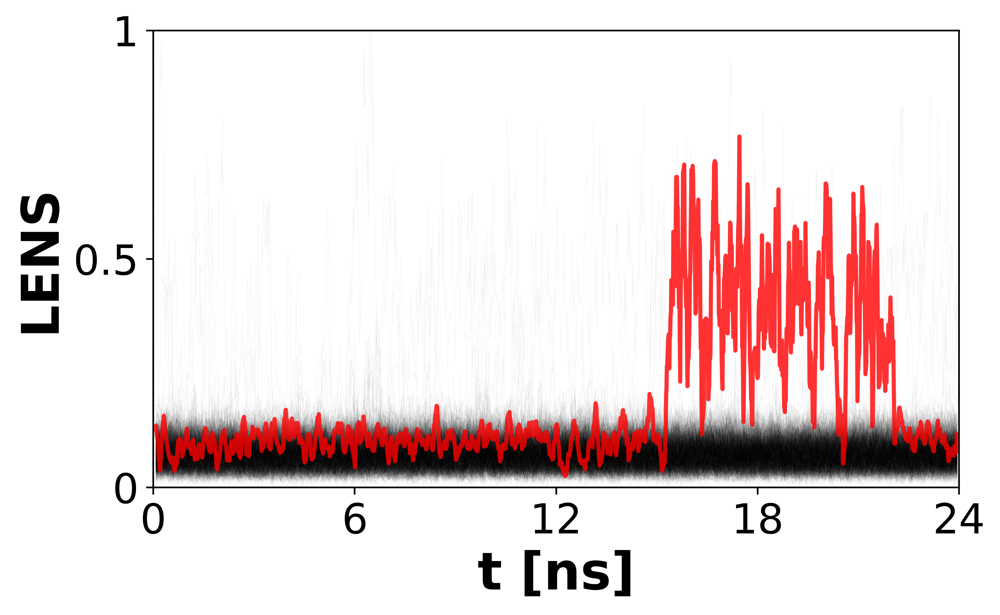

In [27]:
fig, axes = plt.subplots(
    1, figsize=(7, 4), dpi=500
)

for flns in LENS_rolling_norm:
    axes.plot(
        time,
        flns,
        color="black",
        linewidth=0.01,
        alpha=0.8,
    )
    
axes.plot(
        time,
        LENS_rolling_norm[460],
        color="red",
        linewidth=2,
        alpha=0.8)

axes.set_xlim(savGolPrint[0]+window_length // 2, savGolPrint[-1]+window_length // 2)
axes.set_xlabel(r't [ns]', weight='bold', size=25)
axes.set_xticks(xticks)
axes.set_xticklabels([0, 6, 12, 18, 24], fontsize=20)

axes.set_ylabel(r'LENS', weight='bold', size=25)
axes.set_yticks([0, 0.5, 1])
axes.set_yticklabels([0,0.5,1], fontsize=20)
axes.set_ylim((0,1))


plt.subplots_adjust(wspace=0.08)
plt.savefig(XYZ_OUTDIR+'Figure/LENS_withTRJ.png', bbox_inches='tight')

# 3. (LENS-TimeSOAP) LEAP descriptor

## 3.1 Stack descriptors and reshape

In [28]:
djoint_d = np.dstack((np.transpose(tSOAP_rolling_norm),np.transpose(LENS_rolling_norm)))

In [29]:
np.shape(djoint_d)

(1991, 995, 2)

In [30]:
djoint_d_fl = np.array(djoint_d).reshape(np.shape(djoint_d)[0]*np.shape(djoint_d)[1],np.shape(djoint_d)[2])

In [31]:
djoint_d_fl.shape

(1981045, 2)

In [32]:
LEAP = []

for i in range(0, len(djoint_d_fl)):
    leap = np.sqrt(djoint_d_fl[i, 1]**2+djoint_d_fl[i, 0]**2)
    
    LEAP.append(leap)

In [33]:
ts_LEAP = np.array(LEAP).reshape(LENS_rolling_norm.shape[1], LENS_rolling_norm.shape[0])
ts_LEAP = ts_LEAP.transpose()

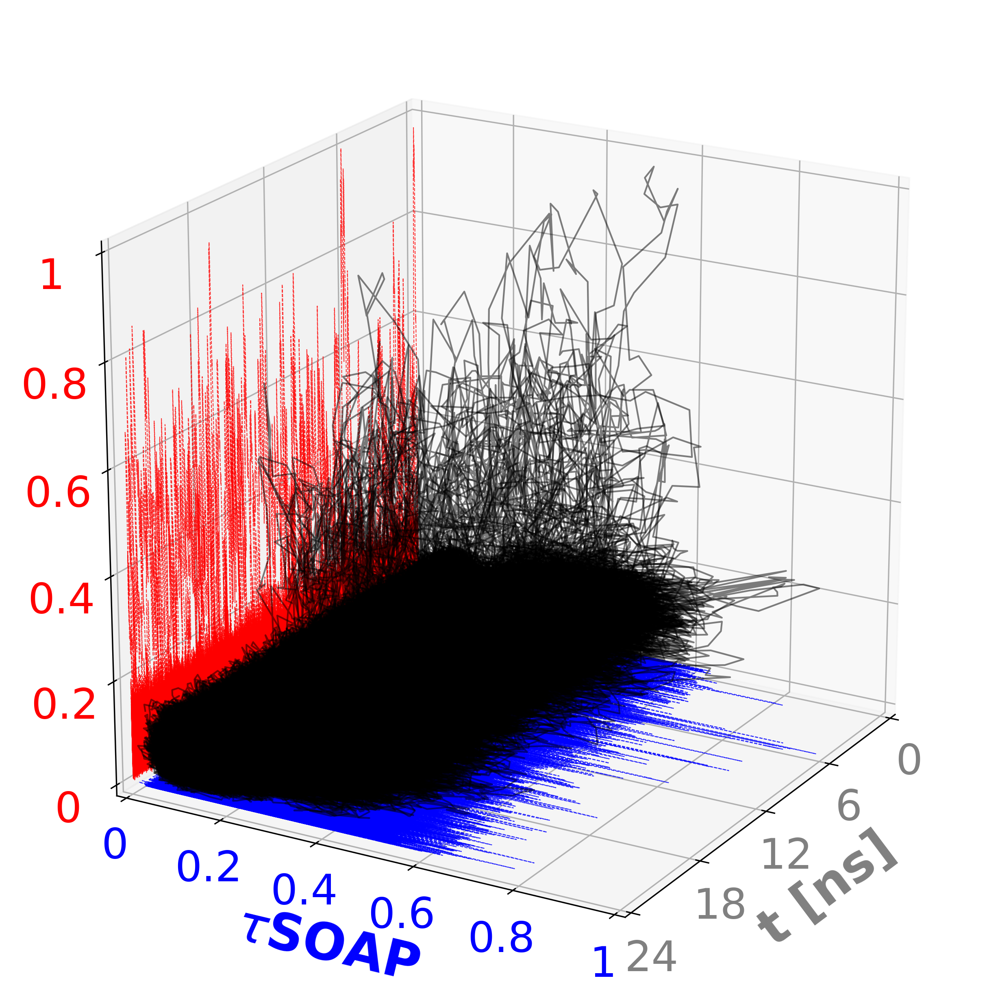

In [34]:
# syntax for 3-D projection
fig = plt.figure(figsize=(10,8), dpi=300)
fig.subplots_adjust(top=1, bottom=0, left=0, right=1, wspace=0)
# fig.subplots_adjust(left=-20, right=0, bottom=0, top=1)

ax = fig.add_subplot(111, projection='3d', aspect='equal')
 
# defining all 3 axis
z = []
x = time
y = []

for lsig in LENS_rolling_norm:
    y = lsig
    ax.plot(x, y, zs=0, zdir='y', linewidth=0.5, linestyle='--', color='red', alpha=0.8)

for tsig in tSOAP_rolling_norm:
            
        # colors = cm.Blues(np.linspace(0, 1, len(neigList_tr[particle][frame])))
    y = tsig
    ax.plot(x, y, zs=0, zdir='z', linewidth=0.5, linestyle='--', color='blue', alpha=0.8)
    
for particle in range(0, len(LENS_rolling_norm)):
    
    y = tSOAP_rolling_norm[particle]
    z = LENS_rolling_norm[particle]
    ax.plot(x, y, zs=z, zdir='z', linewidth=1, color='black', alpha=0.5)
    

ax.set_xlim(0, np.max(time))
ax.set_ylim(0, 1)
ax.set_zlim(0, 1)

ax.set_xlabel(r't [ns]',  weight='bold', color='gray', size=30, labelpad=15)
# xticks = np.array(list(filter(lambda x: (x % 500 == 0), time)))
xticks = np.array([0, 500, 1000, 1500, 2000])
ax.set_xticks(xticks)
ax.set_xticklabels(xticks*12 //1000, fontsize=25, color='gray')

ax.set_ylabel(r'$\tau$SOAP', weight='bold', color='blue', size=30, labelpad=15)
ax.set_yticks([0, 0.2, 0.4, 0.6, 0.8, 1])
ax.set_yticklabels([0, 0.2, 0.4, 0.6, 0.8, 1], fontsize=25, color='blue')

# ax.set_zlabel(r'LENS', weight='bold', color='red', size=30, rotation=90, labelpad=15)
ax.set_zticks([0, 0.2, 0.4, 0.6, 0.8, 1])
ax.set_zticklabels([0, 0.2, 0.4, 0.6, 0.8, 1], fontsize=25, color='red')
ax.zaxis.set_tick_params(pad=10)

        
ax.view_init(elev=20., azim=30, roll=0)
# bbox = fig.bbox_inches.from_bounds(2, 2, 12, 6)

# ax.set_axis_off()
# plotting
plt.savefig(XYZ_OUTDIR+'Figure/3Dplot_tSOAP_LENS.png', bbox_inches='tight')

## 3.2 2D LEAP phase space 

/tmp/ipykernel_18566/527934399.py:7: RuntimeWarning: divide by zero encountered in log
  ax.pcolormesh(xcenters, ycenters, np.log(H).T, cmap=plt.get_cmap('jet'), alpha=1)


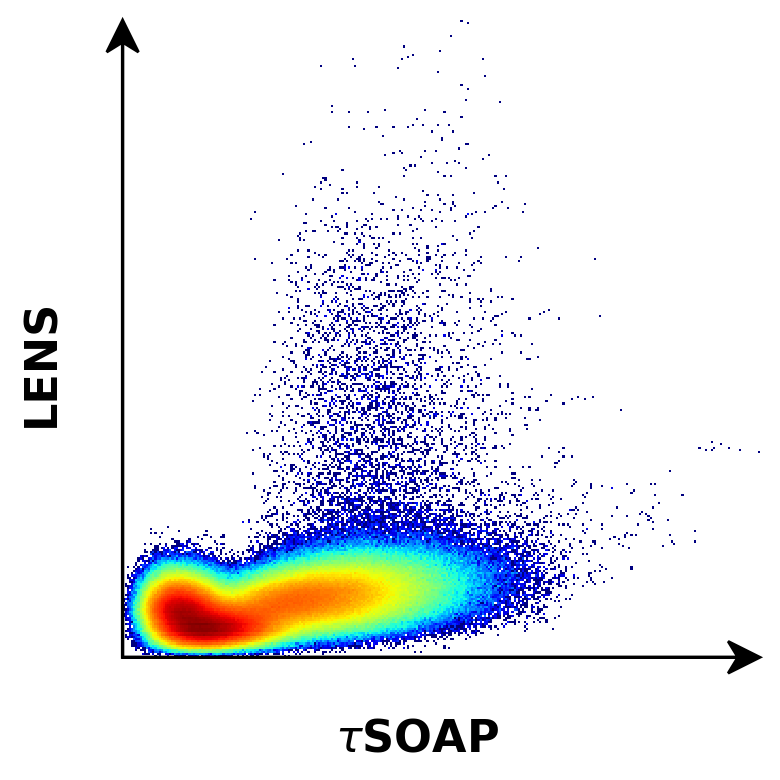

In [35]:
_, ax = plt.subplots(figsize=(4, 4), dpi=200, tight_layout=True)
H, x, y = np.histogram2d(djoint_d_fl[:,0], djoint_d_fl[:,1], bins=300)
xcenters = (x[:-1] + x[1:]) / 2

ycenters = (y[:-1] + y[1:]) / 2

ax.pcolormesh(xcenters, ycenters, np.log(H).T, cmap=plt.get_cmap('jet'), alpha=1)
ax.set_xlabel(r'$\tau$SOAP', weight='bold',size=16)
ax.set_ylabel('LENS', weight='bold',size=16)

for side in ['right','top','left','bottom']:
    ax.spines[side].set_visible(False)
    
for side in ['bottom','right','top','left']:
    ax.spines[side].set_linewidth(1)

ax.tick_params(
axis='both',          # changes apply to the x-axis
which='major',      # both major and minor ticks are affected
bottom=False,
left=False,      
labelleft=False,
labelbottom=False) 
annots = arrowed_spines(ax, locations=('bottom right', 'left up')) 

In [36]:
# TRJ to draw on to the scatter plot
all_trj = []
for particle in range(0, np.shape(djoint_d)[1]):
    trj = djoint_d[:, particle, :]
    all_trj.append(trj)

## 3.3 2D Onion Clustering

In [37]:
signal_x = []
signal_y = []
clusters_j = []

with open(XYZ_DIR+'signal_with_labels.dat', 'r') as f:
    lines = f.readlines()
    
    for idx, line in enumerate(lines[1:]):
        row = line.split()
        signal_x.append(float(row[0]))
        signal_y.append(float(row[1]))
        clusters_j.append(int(row[2]))

In [38]:
x_dim = len(signal_x)
y_dim = len(signal_y)

In [39]:
signal_joint_fl = np.empty((x_dim, 2))

for i in range(0, x_dim):
    signal_joint_fl[i][0] = signal_x[i]
    signal_joint_fl[i][1] = signal_y[i]    

In [40]:
signal_joint_fl.shape

(1970100, 2)

In [41]:
OnionCL_len = int(signal_joint_fl.shape[0]/djoint_d.shape[1])  #Get the length of data AFTER ONION clustering

In [42]:
OnionCL_len

1980

In [43]:
djoint_dCUT = np.dstack((np.transpose(tSOAP_rolling_norm[:, 0:OnionCL_len]),np.transpose(LENS_rolling_norm[:, 0:OnionCL_len])))

In [44]:
djoint_dCUT.shape

(1980, 995, 2)

In [45]:
palette = [sns.color_palette('mako',n_colors=np.max(clusters_j))[0]]
palette = ['#DCE319FF', '#440154FF', '#20A387FF']  #['#762a83']+ ['#fdd0a2', '#1b7837', '#d94801']
palette = sns.color_palette(palette)
# palette=sns.color_palette('twilight',n_colors=np.max(clusters_j)) ['#fd8d3c']
palette

[(0.8627450980392157, 0.8901960784313725, 0.09803921568627451),
 (0.26666666666666666, 0.00392156862745098, 0.32941176470588235),
 (0.12549019607843137, 0.6392156862745098, 0.5294117647058824)]

/home/cristina/Desktop/PhD/LEAP/v2.1/functions_new.py:83: RuntimeWarning: divide by zero encountered in log
  lh = numpy.log(h)
/tmp/ipykernel_18566/4282713908.py:26: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([0, 0.2, 0.4, 0.6, 0.8, 1])
/tmp/ipykernel_18566/4282713908.py:27: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([0, 0.2, 0.4, 0.6, 0.8, 1])


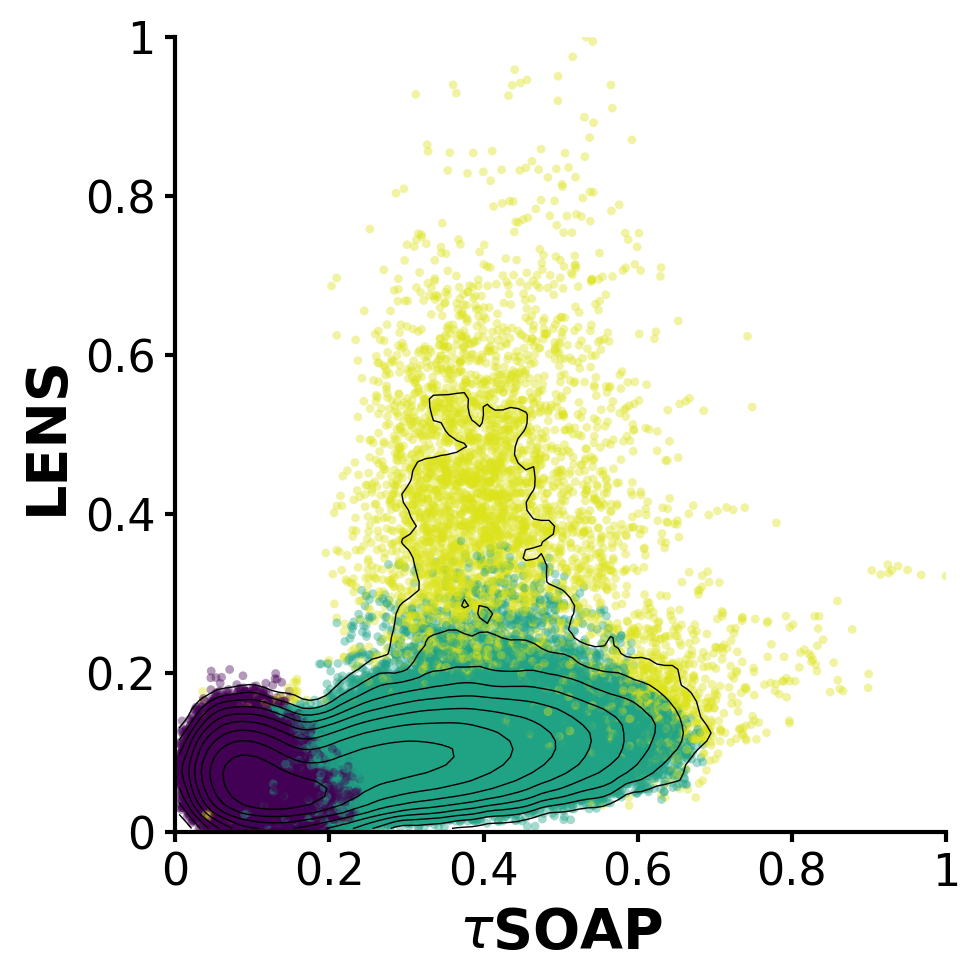

In [46]:
import matplotlib.ticker as ticker

_, ax = plt.subplots(1, figsize=(5,5), dpi=200, tight_layout=True)

ax.scatter(signal_joint_fl[:,0],signal_joint_fl[:,1], c=np.array(palette)[clusters_j], marker='.', s=40, edgecolors='none', alpha=0.4)
lh, Xe, Ye, lhmin = getDensity(signal_joint_fl, 0, 1, 100)
levels = 10
cont = ax.contour(Xe,
    Ye,
    lh,
    colors="k",
    linewidths=0.5,
    levels=levels,
    antialiased=True,
    linestyles="solid",
    vmin=lhmin,
    vmax=0,
)

ax.set_xlim((0,1))
ax.set_ylim((0,1))

ax.set_xlabel(r'$\tau$SOAP', weight='bold',size=20)
ax.set_ylabel('LENS', weight='bold',size=20)

ax.set_xticklabels([0, 0.2, 0.4, 0.6, 0.8, 1])
ax.set_yticklabels([0, 0.2, 0.4, 0.6, 0.8, 1])

for side in ['right','top']:
    ax.spines[side].set_visible(False)
for side in ['bottom','right','top','left']:
    ax.spines[side].set_linewidth(1.5)
    

ax.tick_params(
axis='x',          # changes apply to the x-axis
which='major',      # both major and minor ticks are affected
bottom=True,
labelbottom=True,
width=1.5,
labelsize=16,
color='black'
) 

ax.tick_params(
axis='y',          # changes apply to the x-axis
which='major',      # both major and minor ticks are affected
left=True,
labelleft=True,
width=1.5,
labelsize=16,
color='black'
) 
     
for side in ['right','top']:
    ax.spines[side].set_visible(False)
for side in ['bottom','right','top','left']:
    ax.spines[side].set_linewidth(1.5)

plt.savefig(XYZ_OUTDIR+'Figure/2DOnion_clustering.png')

In [47]:
diffCUT = djoint_d.shape[0] - OnionCL_len
windowToUSE_CUT = slice(eq+window_length // 2, -(window_length // 2+diffCUT))

In [48]:
clusters_j = np.array(clusters_j)

In [49]:
reshaped_labels = prepareData(clusters_j.reshape(np.shape(djoint_dCUT)[0],np.shape(djoint_dCUT)[1]))
export(XYZ_OUTDIR+NAME+'ONION_clustering_LEAP.xyz',  XYZ_DIR+HDF5_TRJ, windowToUSE_CUT, GROUP, XYZ_ORIG, reshaped_labels, SOAPatomMask)

## 3.4 1D Onion Clustering

In [50]:
# Thresholds from Onion_Clustering/211_600/1D-tsoap/final_thresholds.txt
tSOAP_COFF = [0]+[0.25, 0.5]+[1.1]

In [51]:
tSOAP_COFF = list(tSOAP_COFF)

In [52]:
# Thresholds from Onion_Clustering/211_600/1D-lens/final_thresholds.txt
LENS_COFF = [0]+[0.16, 0.23, 0.35]+[1.1]

In [53]:
LENS_COFF = list(LENS_COFF)

In [54]:
palette_tSOAP = ['white', 'lightblue', 'blue']
palette_tSOAP = sns.color_palette(palette_tSOAP)
palette_tSOAP

[(1.0, 1.0, 1.0),
 (0.6784313725490196, 0.8470588235294118, 0.9019607843137255),
 (0.0, 0.0, 1.0)]

In [55]:
xticks = np.array(xticks)

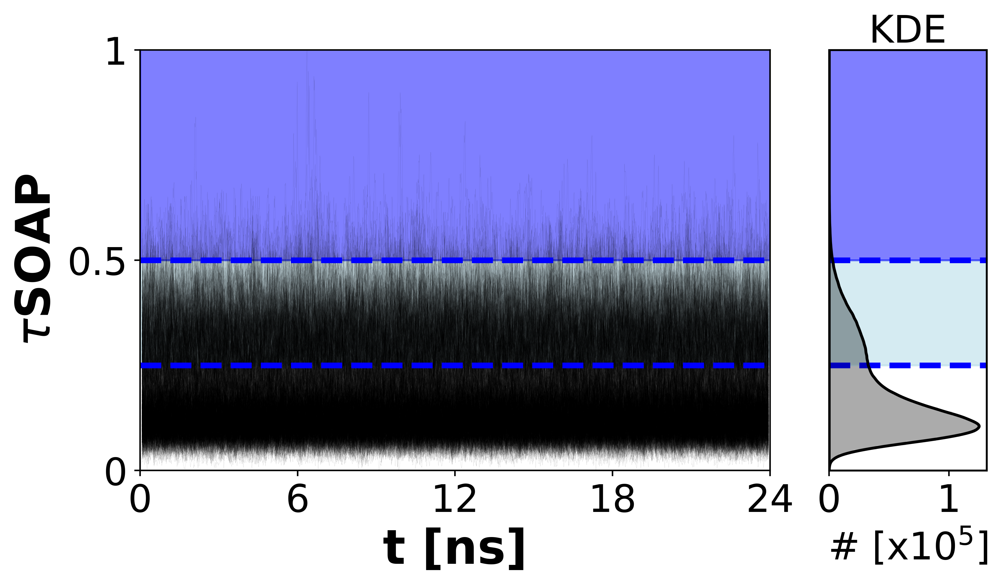

In [56]:
fig, (ax, ax3) = plt.subplots(1, 2,figsize=(8,4), width_ratios=[4, 1], dpi=500)
linewidth = 0.1
alpha = 0.5

plt.rcParams['axes.linewidth'] = 1
ax.tick_params(top=False,
               bottom=True,
               left=True,
               right=False, length=3, labelsize=20)

ax.set_xlabel(r't [$ns$]', size=25)

particle = [i for i in range(0, tSOAP_rolling_norm.shape[0])]
for p in particle:
    ax.plot(
        time,
        tSOAP_rolling_norm[p],
        color="black",
        linewidth=0.03,
        alpha=0.5,
    )
    
ax.set_xlim(savGolPrint[0]+window_length // 2, savGolPrint[-1]+window_length // 2)
ax.set_xlabel(r't [ns]', weight='bold', size=25)
ax.set_xticks(xticks)
ax.set_xticklabels(xticks*12 //1000, fontsize=20)

ax.set_ylabel(r'$\tau$SOAP',  weight='bold', size=25)
ax.set_yticks([0, 0.5, 1])
ax.set_yticklabels([0,0.5,1], fontsize=20)
ax.set_ylim((0,1))

for idx in range(0, len(tSOAP_COFF)-1):
    ax.axhspan(tSOAP_COFF[idx], tSOAP_COFF[idx+1], color=palette_tSOAP[idx], alpha=0.5)
    
hist = ax3.hist(np.array(signal_joint_fl[:, 0]), alpha=0.4, color='gray', bins=100, orientation=u'horizontal')

ax3.set_yticklabels([], size=20)
ax3.set_yticks([], [])
ax3.set_ylim(0, 1)

ax3.set_xlabel("# [x$10^5$]", size=20)
ax3.set_xticks([0,1e5])              
ax3.set_xticklabels([0,1], size=20) 

ax3.tick_params(top=False,
               bottom=True,
               left=False,
               right=False, length=3, labelsize=20)

ax2 = ax3.twiny()
my_kde = sns.kdeplot(y=np.array(signal_joint_fl[:, 0]), bw_adjust=0.7, linewidth=1.5, color='black', gridsize=500, ax=ax2, fill=True)
y = my_kde.collections[0].get_paths()[0]
v = y.vertices
lx = [v[r][0] for r in range(len(v))]
ly = [v[r][1] for r in range(len(v))]

ax2.set_xlabel("KDE", size=20)
ax2.set_xticklabels([], size=20)
ax2.set_xticks([], [])
    


for idx in range(0, len(tSOAP_COFF)-1):
    ax3.axhspan(tSOAP_COFF[idx], tSOAP_COFF[idx+1], color=palette_tSOAP[idx], alpha=0.5)

for i in range(0, len(tSOAP_COFF)-1):
    ax.axhline(y=tSOAP_COFF[i+1], c="blue", linewidth=3, linestyle="--")
    ax3.axhline(y=tSOAP_COFF[i+1], c="blue", linewidth=3, linestyle="--")

# y_formatter = ScalarFormatter(useOffset=True)
# ax.yaxis.set_major_formatter(y_formatter)

# ax.ticklabel_format(axis="y", style="sci", scilimits=(0,0))
ax.yaxis.get_offset_text().set_fontsize(20)
plt.subplots_adjust(wspace=0.1)


plt.subplots_adjust(wspace=0.15)
plt.savefig(XYZ_OUTDIR+'Figure/1DOnion_tSOAP_wdistribution.png', bbox_inches='tight')

In [57]:
palette_LENS = ['white', 'mistyrose', 'lightsalmon', 'red']
palette_LENS = sns.color_palette(palette_LENS)
palette_LENS

[(1.0, 1.0, 1.0),
 (1.0, 0.8941176470588236, 0.8823529411764706),
 (1.0, 0.6274509803921569, 0.47843137254901963),
 (1.0, 0.0, 0.0)]

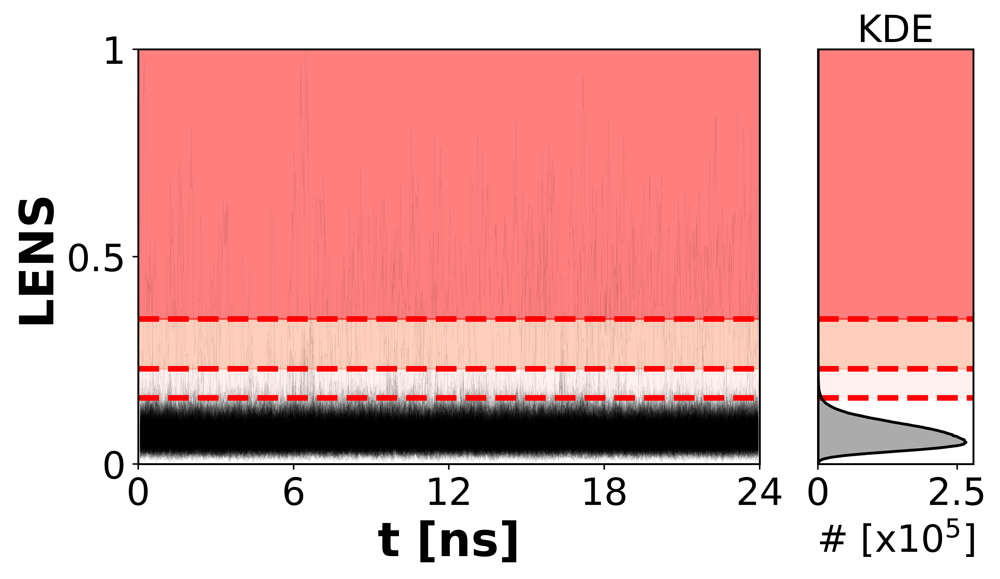

In [58]:
fig, (ax, ax3) = plt.subplots(1, 2,figsize=(8,4), width_ratios=[4, 1], dpi=500)
linewidth = 0.1
alpha = 0.5

plt.rcParams['axes.linewidth'] = 1
ax.tick_params(top=False,
               bottom=True,
               left=True,
               right=False, length=3, labelsize=20)

ax.set_xlabel(r't [$ns$]', size=25)

particle = [i for i in range(0, LENS_rolling_norm.shape[0])]
for p in particle:
    ax.plot(
        time,
        LENS_rolling_norm[p],
        color="black",
        linewidth=0.03,
        alpha=0.5,
    )
    
ax.set_xlim(savGolPrint[0]+window_length // 2, savGolPrint[-1]+window_length // 2)
ax.set_xlabel(r't [ns]', weight='bold', size=25)
ax.set_xticks(xticks)
ax.set_xticklabels(xticks*12 //1000, fontsize=20)

ax.set_ylabel(r'LENS', weight='bold', size=25)
ax.set_yticks([0, 0.5, 1])
ax.set_yticklabels([0,0.5,1], fontsize=20)
ax.set_ylim((0,1))

for idx in range(0, len(LENS_COFF)-1):
    ax.axhspan(LENS_COFF[idx], LENS_COFF[idx+1], color=palette_LENS[idx], alpha=0.5)
    
hist = ax3.hist(np.array(signal_joint_fl[:, 1]), alpha=0.4, color='gray', bins=100, orientation=u'horizontal')

ax3.set_yticklabels([], size=20)
ax3.set_yticks([], [])
ax3.set_ylim(0, 1)

ax3.set_xlabel("# [x$10^5$]", size=20)
ax3.set_xticks([0,2.5e5])              
ax3.set_xticklabels([0,2.5], size=20) 

ax3.tick_params(top=False,
               bottom=True,
               left=False,
               right=False, length=3, labelsize=20)

ax2 = ax3.twiny()
my_kde = sns.kdeplot(y=np.array(signal_joint_fl[:, 1]), bw_adjust=0.7, linewidth=1.5, color='black', gridsize=500, ax=ax2, fill=True)
y = my_kde.collections[0].get_paths()[0]
v = y.vertices
lx = [v[r][0] for r in range(len(v))]
ly = [v[r][1] for r in range(len(v))]

ax2.set_xlabel("KDE", size=20)
ax2.set_xticklabels([], size=20)
ax2.set_xticks([], [])
    


for idx in range(0, len(LENS_COFF)-1):
    ax3.axhspan(LENS_COFF[idx], LENS_COFF[idx+1], color=palette_LENS[idx], alpha=0.5)

for i in range(0, len(LENS_COFF)-1):
    ax.axhline(y=LENS_COFF[i+1], c="red", linewidth=3, linestyle="--")
    ax3.axhline(y=LENS_COFF[i+1], c="red", linewidth=3, linestyle="--")

# y_formatter = ScalarFormatter(useOffset=True)
# ax.yaxis.set_major_formatter(y_formatter)

# ax.ticklabel_format(axis="y", style="sci", scilimits=(0,0))
ax.yaxis.get_offset_text().set_fontsize(20)


plt.subplots_adjust(wspace=0.15)
plt.savefig(XYZ_OUTDIR+'Figure/LENS_wdistribution.png', bbox_inches='tight')

In [59]:
dim = 0

with open(XYZ_DIR+'tSOAP_Onion.dat', 'r') as f:
    lines = f.readlines()
    
    for idx, line in enumerate(lines[0:]):
        row = line.split()
        if row[0] == '#':
            dim = dim + 1
        else:
            pass

In [60]:
OnionCL_len = dim//2

In [61]:
OnionCL_len

1980

In [62]:
djoint_dCUT = np.dstack((np.transpose(tSOAP_rolling_norm[:, 0:OnionCL_len]),np.transpose(LENS_rolling_norm[:, 0:OnionCL_len])))

In [63]:
len(djoint_dCUT[0])

995

In [64]:
djoint_dCUT_fl = np.array(djoint_dCUT).reshape(np.shape(djoint_dCUT)[0]*np.shape(djoint_dCUT)[1],np.shape(djoint_dCUT)[2])

In [65]:
djoint_dCUT_fl.shape

(1970100, 2)

In [66]:
# Assign tSOAP clusters to IDs
clusters_partition_tSOAP = []
cluster_tmp = 0

for i in range(0, len(djoint_dCUT_fl)):
    for ts in range(0, len(tSOAP_COFF)-1):
        if tSOAP_COFF[ts] <= djoint_dCUT_fl[i, 0] < tSOAP_COFF[ts+1]:
            cluster_tmp = ts
            clusters_partition_tSOAP.append(cluster_tmp)

# Assign LENS clusters to IDs
clusters_partition_LENS = []
cluster_tmp = 0

for i in range(0, len(djoint_dCUT_fl)):
    for ts in range(0, len(LENS_COFF)-1):
        if LENS_COFF[ts] <= djoint_dCUT_fl[i, 1] < LENS_COFF[ts+1]:
            cluster_tmp = ts
            clusters_partition_LENS.append(cluster_tmp)    

In [67]:
clusters_partition_tSOAP = np.array(clusters_partition_tSOAP)
clusters_partition_LENS = np.array(clusters_partition_LENS)

In [68]:
diffCUT = djoint_d.shape[0] - OnionCL_len
windowToUSE_CUT = slice(eq+window_length // 2, -(window_length // 2+diffCUT))

In [69]:
reshaped_labels_tSOAP = prepareData(clusters_partition_tSOAP.reshape(np.shape(djoint_dCUT)[0],np.shape(djoint_dCUT)[1]))
export(XYZ_OUTDIR+NAME+'ONION_tSOAP.xyz',  XYZ_DIR+HDF5_TRJ, windowToUSE_CUT, GROUP, XYZ_ORIG, reshaped_labels_tSOAP, SOAPatomMask)

In [70]:
reshaped_labels_LENS = prepareData(clusters_partition_LENS.reshape(np.shape(djoint_dCUT)[0],np.shape(djoint_dCUT)[1]))
export(XYZ_OUTDIR+NAME+'ONION_LENS.xyz',  XYZ_DIR+HDF5_TRJ, windowToUSE_CUT, GROUP, XYZ_ORIG, reshaped_labels_LENS, SOAPatomMask)

## 3.5 Get Fluctuations from 1D Onion clusters

In [71]:
# Data from Onion_Clustering/211_600/1D-tsoap/final_states.txt
sigma_lastCL_tSOAP = 0.14
mu_lastCL_tSOAP = 0.45

# Data from Onion_Clustering/211_600/1D-lens/final_states.txt
sigma_lastCL_LENS = 0.2
mu_lastCL_LENS = 0.43

# Data from Onion_Clustering/211_600/1D-lens/final_thresholds.txt
last_thr_tSOAP = 0.5
last_thr_LENS = 0.35

In [72]:
FLUCT_thr_tSOAP = last_thr_tSOAP
FLUCT_thr_LENS = last_thr_LENS

/home/cristina/Desktop/PhD/LEAP/v2.0/functions_new.py:83: RuntimeWarning: divide by zero encountered in log
  lh = numpy.log(h)
/tmp/ipykernel_57529/4123597291.py:24: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([0, 0.2, 0.4, 0.6, 0.8, 1])
/tmp/ipykernel_57529/4123597291.py:25: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([0, 0.2, 0.4, 0.6, 0.8, 1])


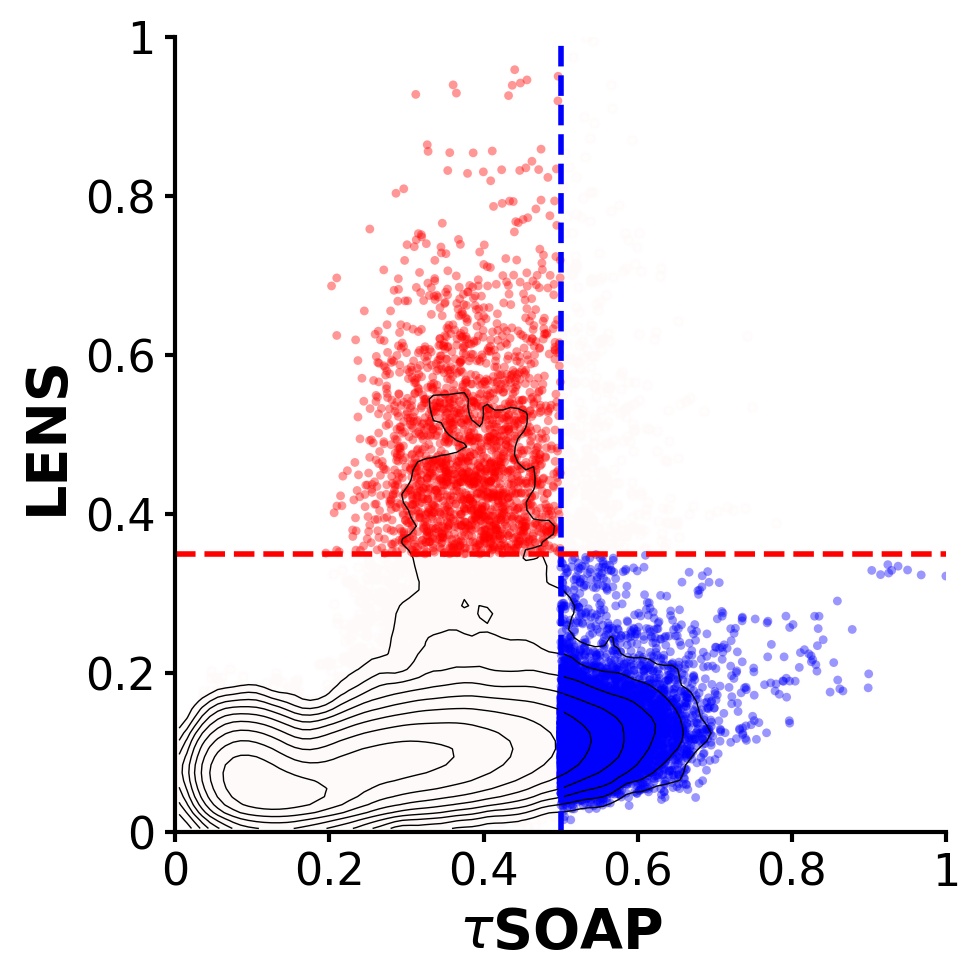

In [73]:
_, ax = plt.subplots(1, figsize=(5,5), dpi=200, tight_layout=True)

ax.scatter(signal_joint_fl[:,0],signal_joint_fl[:,1], c='snow', marker='.', s=40, edgecolors='snow', alpha=0.4)
lh, Xe, Ye, lhmin = getDensity(signal_joint_fl, 0, 1, 100)
levels = 10
cont = ax.contour(Xe,
    Ye,
    lh,
    colors="k",
    linewidths=0.5,
    levels=levels,
    antialiased=True,
    linestyles="solid",
    vmin=lhmin,
    vmax=0,
)

ax.set_xlim((0,1))
ax.set_ylim((0,1))

ax.set_xlabel(r'$\tau$SOAP', weight='bold',size=20)
ax.set_ylabel('LENS', weight='bold',size=20)

ax.set_xticklabels([0, 0.2, 0.4, 0.6, 0.8, 1])
ax.set_yticklabels([0, 0.2, 0.4, 0.6, 0.8, 1])

for side in ['right','top']:
    ax.spines[side].set_visible(False)
for side in ['bottom','right','top','left']:
    ax.spines[side].set_linewidth(1.5)
    
    
ax.tick_params(
axis='both',          # changes apply to the x-axis
which='major',      # both major and minor ticks are affected
bottom=True,
left=True,      
labelleft=True,
labelbottom=True,
width=1.5,
labelsize=16,
)     


ax.axvline(x=FLUCT_thr_tSOAP, c="blue", linewidth=2, linestyle="--")
ax.axhline(y=FLUCT_thr_LENS, c="red", linewidth=2, linestyle="--")

tmp = np.where(np.logical_and(signal_joint_fl[:, 0] > FLUCT_thr_tSOAP, signal_joint_fl[:, 1] < 0.35))
ax.scatter(signal_joint_fl[tmp, 0], signal_joint_fl[tmp, 1], c='blue', marker='.', s=40, edgecolors='none', alpha=0.4)

tmp = np.where(np.logical_and(signal_joint_fl[:, 1] > FLUCT_thr_LENS, signal_joint_fl[:, 0] < 0.5))
ax.scatter(signal_joint_fl[tmp, 0], signal_joint_fl[tmp, 1], c='red', marker='.', s=40, edgecolors='none', alpha=0.4)

# tmp = np.where(np.logical_and(signal_joint_fl[:, 1] > 0.35, signal_joint_fl[:, 0] > 0.5))
# ax.scatter(signal_joint_fl[tmp, 0], signal_joint_fl[tmp, 1], c='gray', marker='.', s=40, edgecolors='none', alpha=0.4)

# # draw x and y axis
# ax.arrow(0, 0, 1, 0., fc='k', ec='k', lw = 1.5, 
#          head_width=0.1, head_length=0.1, overhang = 0.1, 
#          length_includes_head= True, clip_on = False) 
 
# ax.arrow(0, 0, 0., 1, fc='k', ec='k', lw = 1.5, 
#          head_width=0.1, head_length=1.5, overhang = 0.5, 
#          length_includes_head= True, clip_on = False) 



# annots = arrowed_spines(ax, locations=('bottom right', 'left up')) 
plt.savefig(XYZ_OUTDIR+'Figure/Onion_clustering_1DBLUE_RED_regions.png')

## 3.5 Some example particles

/tmp/ipykernel_57529/3943071911.py:36: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([0, 0.2, 0.4, 0.6, 0.8, 1], fontsize=20)
/tmp/ipykernel_57529/3943071911.py:37: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([0, 0.2, 0.4, 0.6, 0.8, 1], fontsize=20)


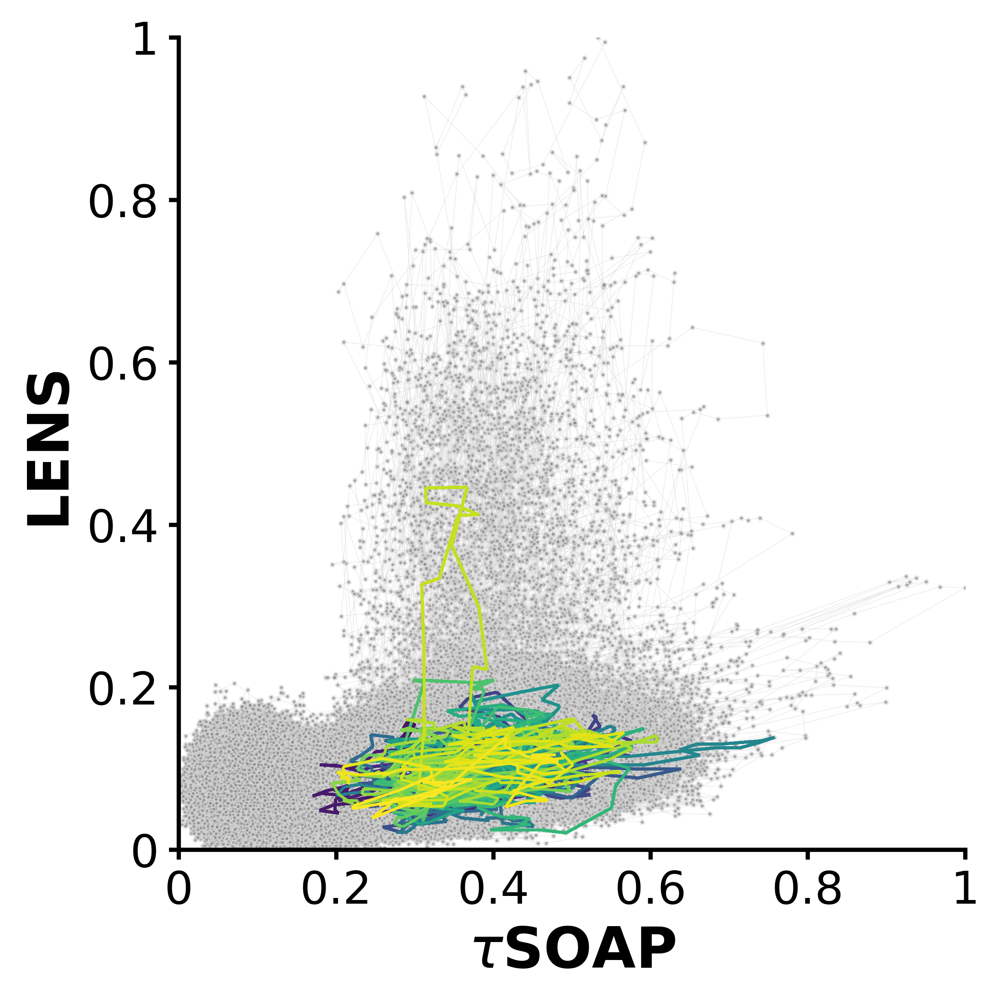

In [74]:
from matplotlib.collections import LineCollection
_, ax = plt.subplots(1, figsize=(5,5), dpi=500, tight_layout=True)

# ax.scatter(djoint_d_fl[:,0],djoint_d_fl[:,1], marker='o', s=1, color='lightgray', markerfacecolors='black', linewidths=0.2, alpha=0.5)
for particle in range(0, np.shape(djoint_d)[1]):
    trj = all_trj[particle]
    ax.plot(trj[:, 0], trj[:, 1], marker='o', markersize=1, color='lightgray', markerfacecolor='black', linewidth=0.2, alpha=0.5)

for particle in range(0, np.shape(djoint_d)[1]):
    trj = all_trj[particle]
    trj_spec = all_trj[279]
    t = np.arange(0, len(trj_spec))
#     ax.plot(trj[:, 0], trj[:, 1], color='darkgray', linewidth=0.2, alpha=1)
    
segs1 = np.stack((trj_spec[:, 0], trj_spec[:, 1]), axis=1)
segs2 = []
count = 0
for i in range(0, len(segs1)-2):
    s = np.stack((segs1[count], segs1[count+1]), axis=0)
    segs2.append(s)
    count = count+1
#     ax.plot(trj[:, 0], trj[:, 1], color='black', linewidth=0.08, alpha=0.4)
#     ax.plot(trj_spec[:, 0], trj_spec[:, 1], color='black', linewidth=0.08, alpha=1)
    
    lc = LineCollection(segs2, cmap="viridis", linewidth=1, alpha=1, array=np.unique(t))
    plt.gca().add_collection(lc)

# for i in range(0, np.shape(djoint_d)[0]):
#     if trj_spec[i, 1] >= 0.2:
#         ax.plot(trj_spec[i, 0], trj_spec[i, 1], marker='*', markersize=10, color='red', linewidth=0.2, alpha=1)
#         break
    
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)

ax.set_xticklabels([0, 0.2, 0.4, 0.6, 0.8, 1], fontsize=20)
ax.set_yticklabels([0, 0.2, 0.4, 0.6, 0.8, 1], fontsize=20)

ax.set_xlabel(r'$\tau$SOAP', weight='bold',size=20)
ax.set_ylabel(r'LENS', weight='bold',size=20)


for side in ['right','top']:
    ax.spines[side].set_visible(False)
for side in ['bottom','right','top','left']:
    ax.spines[side].set_linewidth(1.5)
        
# ax.axhline(y=0.2, c="red", linewidth=1, linestyle="--")
        
ax.tick_params(
axis='both',          # changes apply to the x-axis
which='major',      # both major and minor ticks are affected
bottom=True,
left=True,      
labelleft=True,
labelbottom=True,
width=1.5,
labelsize=16,
) 

plt.savefig(XYZ_OUTDIR+'Figure/Phase_Space_withTIMETRJ.png')

In [75]:
# TRJ to draw on to the scatter plot
particle = 170
single_trj = djoint_d[:, particle, :]

/tmp/ipykernel_57529/1385942410.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([0, 0.2, 0.4, 0.6, 0.8, 1], fontsize=20)
/tmp/ipykernel_57529/1385942410.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([0, 0.2, 0.4, 0.6, 0.8, 1], fontsize=20)


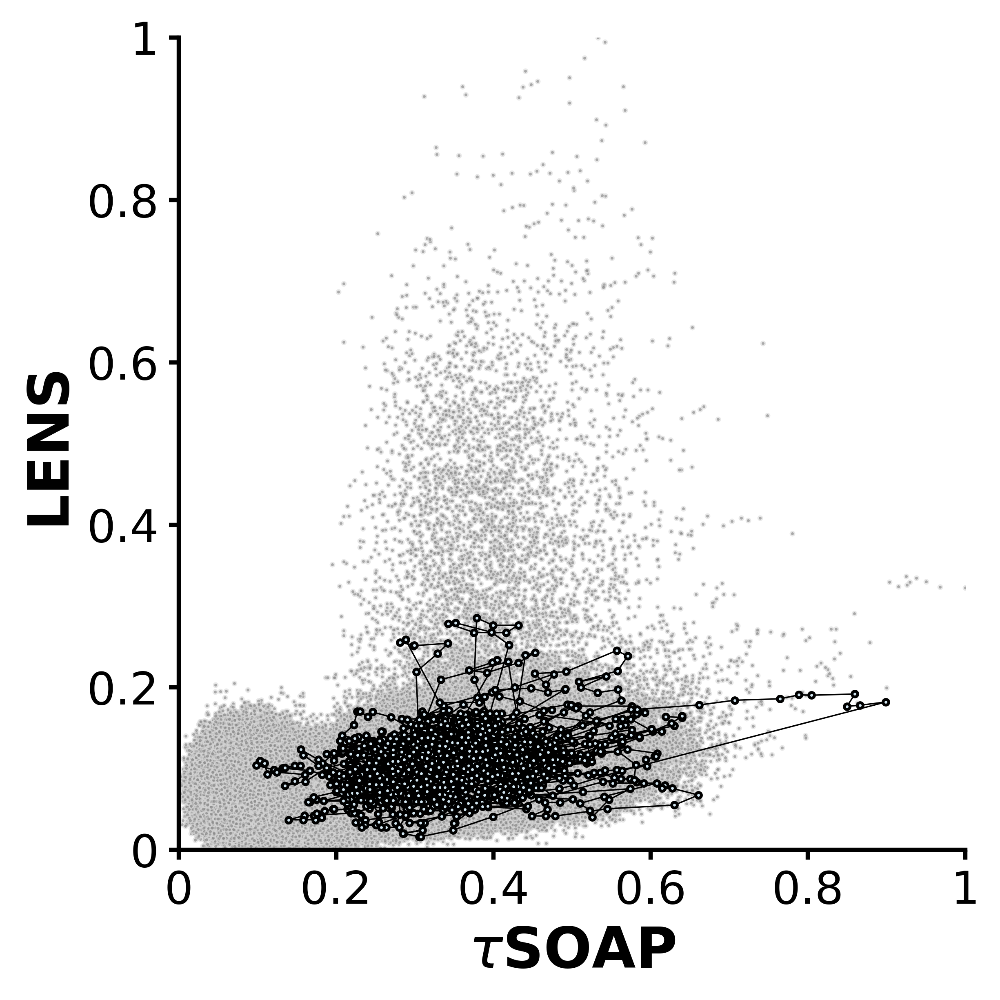

In [76]:
from matplotlib.collections import LineCollection
_, ax = plt.subplots(1, figsize=(5,5), dpi=500, tight_layout=True)

ax.plot(djoint_d_fl[:,0],djoint_d_fl[:,1], marker='o', markersize=1, color='lightgray', markerfacecolor='black', linewidth=0, alpha=0.5)
ax.plot(single_trj[:, 0], single_trj[:, 1], marker='o', markersize=2, color='black', markerfacecolor='#d1e5f0', linewidth=0.5, alpha=1)

# for i in range(0, np.shape(djoint_d)[0]):
#     if trj_spec[i, 1] >= 0.2:
#         ax.plot(trj_spec[i, 0], trj_spec[i, 1], marker='*', markersize=10, color='red', linewidth=0.2, alpha=1)
#         break
    
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)

ax.set_xticklabels([0, 0.2, 0.4, 0.6, 0.8, 1], fontsize=20)
ax.set_yticklabels([0, 0.2, 0.4, 0.6, 0.8, 1], fontsize=20)

ax.set_xlabel(r'$\tau$SOAP', weight='bold',size=20)
ax.set_ylabel(r'LENS', weight='bold',size=20)


for side in ['right','top']:
    ax.spines[side].set_visible(False)
for side in ['bottom','right','top','left']:
    ax.spines[side].set_linewidth(1.5)
        
# ax.axhline(y=0.2, c="red", linewidth=1, linestyle="--")
        
ax.tick_params(
axis='both',          # changes apply to the x-axis
which='major',      # both major and minor ticks are affected
bottom=True,
left=True,      
labelleft=True,
labelbottom=True,
width=1.5,
labelsize=16,
) 

plt.savefig(XYZ_OUTDIR+'Figure/LEAP_particle170.png')

In [77]:
# TRJ to draw on to the scatter plot
particle = 59
single_trj = djoint_d[:, particle, :]

In [ ]:
from matplotlib.collections import LineCollection
_, ax = plt.subplots(1, figsize=(5,5), dpi=500, tight_layout=True)

ax.plot(djoint_d_fl[:,0],djoint_d_fl[:,1], marker='o', markersize=1, color='lightgray', markerfacecolor='black', linewidth=0, alpha=0.5)

ax.plot(single_trj[:, 0], single_trj[:, 1], marker='o', markersize=2, color='black', markerfacecolor='#d1e5f0', linewidth=0.5, alpha=1)

# for i in range(0, np.shape(djoint_d)[0]):
#     if trj_spec[i, 1] >= 0.2:
#         ax.plot(trj_spec[i, 0], trj_spec[i, 1], marker='*', markersize=10, color='red', linewidth=0.2, alpha=1)
#         break
    
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)

ax.set_xticklabels([0, 0.2, 0.4, 0.6, 0.8, 1])
ax.set_yticklabels([0, 0.2, 0.4, 0.6, 0.8, 1])

ax.set_xlabel(r'$\tau$SOAP', weight='bold',size=20)
ax.set_ylabel(r'LENS', weight='bold',size=20)


for side in ['right','top']:
    ax.spines[side].set_visible(False)
for side in ['bottom','right','top','left']:
    ax.spines[side].set_linewidth(1.5)
        
# ax.axhline(y=0.2, c="red", linewidth=1, linestyle="--")
        
ax.tick_params(
axis='both',          # changes apply to the x-axis
which='major',      # both major and minor ticks are affected
bottom=True,
left=True,      
labelleft=True,
labelbottom=True,
width=1.5,
labelsize=16,
) 

plt.savefig(XYZ_OUTDIR+'Figure/LEAP_particle59.png')